# Title 

#### Imports

In [9]:
from typing import Dict, List, Tuple, Optional, Callable
from collections import namedtuple
import os
from functional import seq, pseq
from functional.streams import Sequence
from IPython.core.display import HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import wordcloud as wc

def display_seq(sequence:Sequence,rows:int)-> None:
        sequence._repr_html_= lambda :sequence.tabulate(rows,tablefmt='html')
        display(sequence)
        sequence._repr_html_= lambda :sequence.tabulate(10,tablefmt='html')
        
plt.rcParams['figure.figsize'] = [15, 8]

In [10]:
import functools
def compose(*functions):
    def compose2(f, g):
        return lambda x: f(g(x))
    return functools.reduce(compose2, functions, lambda x: x)

# Infomap

In [11]:
from util import get_envs, cached_load
base_dir = get_envs()["base_dir"]
base_dir

'/home/owner/blob/data/data_mining/dblp/csv/'

In [20]:
label_name = "multilevel"
# label_name = "infomap"
# label_name = "label_coauthor"
subdir_name = label_name + "/"

os.mkdir(base_dir + subdir_name) if not os.path.exists(base_dir + subdir_name) else None

def community_sizes_fn_fun(label_name:str):  return base_dir + label_name+ "/community_sizes.csv"
community_sizes_fn = base_dir + subdir_name + "community_sizes.csv"
titles_by_label_fn = base_dir + subdir_name + "titles_by_label.csv"
idfs_fn = base_dir + subdir_name +  "idfs.csv"
stem_idfs_fn = base_dir + subdir_name +  "stem_idfs.csv"
communities_fn = base_dir + subdir_name +"comunities.csv"

In [13]:
from nltk.stem.porter import *
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
eng_stop = set(stopwords.words('english'))
stemmer = PorterStemmer()
punctuation_mapping= { ord(c): ' '  for c in string.punctuation}

In [14]:
from py2neo import Graph,Node
graph = Graph("bolt://127.0.0.1:7687",auth=("neo4j", "admin"))

In [15]:
# author_count = graph.run("match(n:person) return count(*) as cnt").data()[0]['cnt']
author_count = 2429524

### Distributions

In [18]:
def generate_community_sizes(fn: str,label_name:str) -> pd.DataFrame:
    community_sizes_dict = graph.run(
        "match(n:person) return n.{} as label,count(n) as cnt order by cnt desc".format(label_name)
    ).data()
    result = pd.DataFrame.from_dict(community_sizes_dict)
    result.to_csv(fn,index=False)
    return result

community_sizes = cached_load(community_sizes_fn,lambda fn : pd.read_csv(fn),lambda a: generate_community_sizes(a,label_name)).dropna()

In [34]:
def add_percentage(df:pd.DataFrame)-> pd.DataFrame:
    df['percentage'] = df.cnt / author_count
    return df

titles = ["Infomap","Label Propagation","Multilevel"]
all_community_sizes = seq(["infomap","label_coauthor","multilevel"])\
.map(lambda label:
     cached_load(community_sizes_fn_fun(label),lambda fn : pd.read_csv(fn),lambda a: generate_community_sizes(a,label)).dropna())\
.map(add_percentage)


In [71]:
community_sizes['percentage'] = community_sizes.cnt / author_count

In [72]:
print(community_sizes.sort_values('cnt',ascending=False).head(n=10))

      cnt  label  percentage
0  273536      4    0.112588
1  110684     36    0.045558
2  102391     29    0.042144
3   93268     21    0.038389
4   92316     27    0.037998
5   70787     41    0.029136
6   69693     52    0.028686
7   69407      8    0.028568
8   66543     25    0.027389
9   66364     20    0.027316


In [73]:
community_sizes['cnt'].quantile([0.5,0.75,0.9,0.99,0.999,0.9999,0.99999,1])

0.50000         1.00000
0.75000         2.00000
0.90000         3.00000
0.99000         7.00000
0.99900        20.00000
0.99990     47274.90660
0.99999    105040.86229
1.00000    273536.00000
Name: cnt, dtype: float64

In [74]:
max_label = community_sizes.iloc[community_sizes.cnt.idxmax()]['label']
max_label

4.0

In [37]:
def plot_label_communites(data,bins=100):
    n, bins, patches = plt.hist(data,bins=bins,  facecolor='pink', log=True,)
    plt.xlabel('Community size')
    plt.ylabel('Count')
    plt.yscale('log')
#     plt.xscale('log')
#     plt.show()

In [38]:
len(community_sizes)

168048

Infomap
Label Propagation
Multilevel


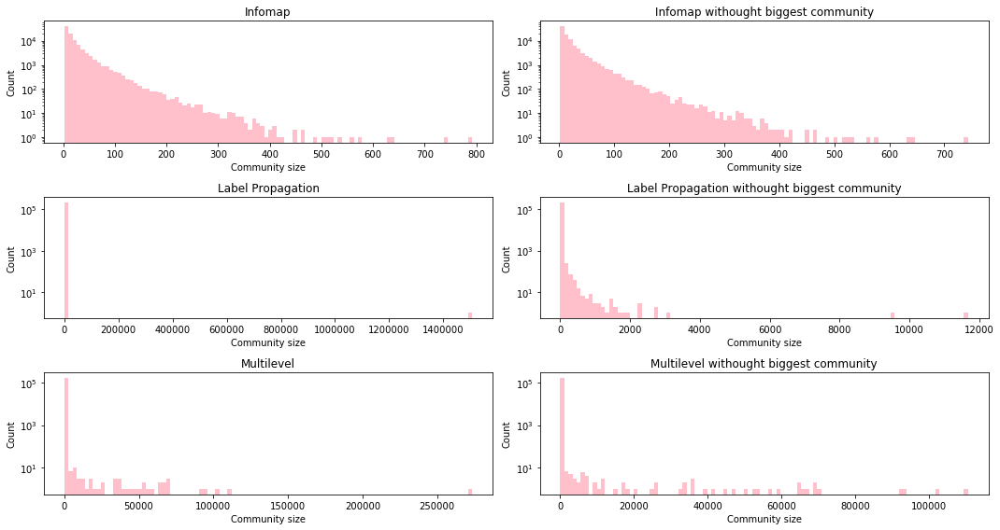

In [54]:
i=0
for title,cs in zip(titles,all_community_sizes):
    print(title)
    i+=1
    plt.subplot(32 * 10 + i)
    plt.title(title)
    plot_label_communites(cs['cnt'],bins = 100)
    i+=1
    plt.subplot(32 * 10 + i)
    plt.title(title+ " withought biggest community")
    max_label = cs.iloc[community_sizes.cnt.idxmax()]['label']
    plot_label_communites(cs['cnt'].where(cs.label != max_label).dropna(),bins = 100)
margin = 5
plt.tight_layout()

In [55]:
# plot_label_communites(community_sizes['cnt'],bins = 100)
# plot_label_communites(community_sizes['cnt'].where(community_sizes.label != max_label).dropna(),bins = 100)

### Summarizing community

In [46]:
def generate_titles_by_label(fn: str) -> pd.DataFrame:
    result = pd.DataFrame.from_dict(
            graph.run(
                "match(n:person)-[:AUTHORS]->(p:publication) return p.title as title, collect(distinct n.{}) as communities".format(label_name)
            ).data()
    )
    result['community'] = result.communities.apply(lambda x: -1 if len(x) == 0 else x[0])
    result = result.drop('communities',axis=1)
    
    result.to_csv(fn,index=False)
    return result


In [47]:
community_count = graph.run("match(n:person) return count(distinct n.{}) as cnt ".format(label_name)).data()[0]['cnt'] *1.0
community_count

256790.0

In [48]:
def generate_idfs(fn: str) -> pd.DataFrame:
    titles_by_label = cached_load(titles_by_label_fn,lambda fn : pd.read_csv(fn),generate_titles_by_label)
    
    result = seq(titles_by_label) \
    .flat_map(lambda row : seq(word_tokenize(row[0].translate(punctuation_mapping).lower())).map(lambda key: (key,row[1]))) \
    .count_by_key().to_pandas(columns = ['keyword','document_count'])

    result['idf'] = result.document_count.apply(lambda x: np.log(community_count/x))
    
    result.to_csv(fn,index=False)
    return result 

idfs_df = cached_load(idfs_fn,lambda fn : pd.read_csv(fn),generate_idfs)
idfs_df['keyword'] = idfs_df.keyword.apply(lambda x: str(x))
idfs = seq(idfs_df.drop('document_count',axis=1)).to_dict() 

In [49]:
def generate_stem_idfs(fn: str) -> pd.DataFrame:
    result = seq(idfs_df.drop('idf',axis=1)) \
        .map(lambda x: (stemmer.stem(x[0]),x[1])) \
        .group_by(lambda x : x[0]) \
        .map(lambda row : (row[0],seq(row[1]).map(lambda x: x[1]).sum())).to_pandas(['keyword', 'document_count'])

    
    result['idf'] = result.document_count.apply(lambda x: np.log(community_count/x))
    result.to_csv(stem_idfs_fn,index=False)
    return result


stem_idfs_df = cached_load(stem_idfs_fn,lambda fn : pd.read_csv(fn),generate_stem_idfs)
stem_idfs_df['keyword'] = stem_idfs_df.keyword.apply(lambda x: str(x))
stem_idfs = seq(stem_idfs_df.drop('document_count',axis=1)).to_dict()
del stem_idfs_df

#### Fetching & Displaying

In [50]:
def community_titles(community:int) -> pd.DataFrame:
    return pd.DataFrame.from_dict(
        graph.run(
            "match(n:person)-[:AUTHORS]->(p:publication) where  n.{} = $id return p.title as title".format(label_name)
            ,id=community
        ).data()
    )

In [1]:
def keywords(titles:pd.DataFrame,stem:bool) -> Sequence:
    lower_words = seq(titles) \
    .map(lambda x : x[0].translate(punctuation_mapping)) \
    .flat_map(word_tokenize) \
    .map(lambda x : x.lower())\
    .filter_not(lambda x: x in eng_stop)
    
    if stem:
        s = lower_words.map(lambda x: stemmer.stem(x))
    else:
        s = lower_words
    
    return s.group_by(lambda x:x) \
    .map(lambda x: (x[0],len(x[1]))) \
    .sorted(key= lambda x: x[1],reverse=True)

NameError: name 'pd' is not defined

In [2]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
        
    display_html(html_str.replace('table','table style="display:inline;margin:25px"'),raw=True)

In [59]:
def community_summary(com:int,tables:bool = True, wordcloud:bool = True):
    c_size = community_sizes.where(community_sizes['label'] == com).dropna().iloc[0]['cnt']
    
    
    c_titles = community_titles(com)
    c_keywords = keywords(c_titles,stem=False)
    c_keyword_sum = c_keywords.map(lambda x: x[1]).sum()
    c_key_tf_idf = c_keywords.map(lambda row: (row[0], (row[1]*1.0/c_keyword_sum )* idfs.get(row[0], np.log(community_count))  )) \
    .sorted(key= lambda x: x[1],reverse=True)
    
    display(HTML(data="<h1>Community " + str(com) + "</h1>" ))
    display(HTML(data="<p>size:" + str(int(c_size)) + "</p>" ))
    display(HTML(data="<p>authors %:" + str(c_size * 100 /author_count) + "</p>" ))
    display(HTML(data="<h2>Titles</h2>" ))
    default_colwidth = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 500)
    display(c_titles.head(n=8))
    pd.set_option('display.max_colwidth', default_colwidth)
    if tables:
        c_stems = keywords(c_titles,stem=True)
        c_stem_sum = c_stems.map(lambda x: x[1]).sum()
        c_stem_tf_idf = c_stems.map(lambda row: (row[0], (row[1]*1.0/c_stem_sum)* stem_idfs.get(row[0], np.log(community_count))  )) \
        .sorted(key= lambda x: x[1],reverse=True)

        head_rows = 20

        display(HTML(data="<h2>Keywords & Stems</h2>" ))
        display_side_by_side(
            c_keywords.to_pandas(['keyword','count']).head(n= head_rows),
            c_key_tf_idf.to_pandas(['keyword','tf-idf']).head(n= head_rows),
            c_stems.to_pandas(['stem','count']).head(n=head_rows),
            c_stem_tf_idf.to_pandas(['stem','tf-idf']).head(n=head_rows)
        )
    
    
    
    if wordcloud:
        freqs = c_key_tf_idf.to_dict()
        word_cloud = wc.WordCloud(max_font_size=40,height=400,width=800, background_color= "white").generate_from_frequencies(freqs)
        plt.figure(figsize=(40,20))

        plt.imshow(word_cloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()

### Known Communities

,title
0,Measuring the influence of mere exposure effect of TV commercial adverts on purchase behavior based on machine learning prediction models.
1,Measuring the influence of mere exposure effect of TV commercial adverts on purchase behavior based on machine learning prediction models.
2,Measuring the influence of mere exposure effect of TV commercial adverts on purchase behavior based on machine learning prediction models.
3,Emotional Contribution Analysis of Online Reviews.
4,Analysis of Chinese Tourists in Japan by Text Mining of a Hotel Portal Site.
5,Topic Classification Method for Analyzing Effect of eWOM on Consumer Game Sales.
6,Community Detection and Growth Potential Prediction Using the Stochastic Block Model and the Long Short-term Memory from Patent Citation Networks.
7,Community Detection and Growth Potential Prediction from Patent Citation Networks.


,keyword,count
0,prediction,40
1,patent,33
2,community,32
3,detection,32
4,growth,32
5,potential,32
6,citation,32
7,networks,32
8,using,16
9,stochastic,16


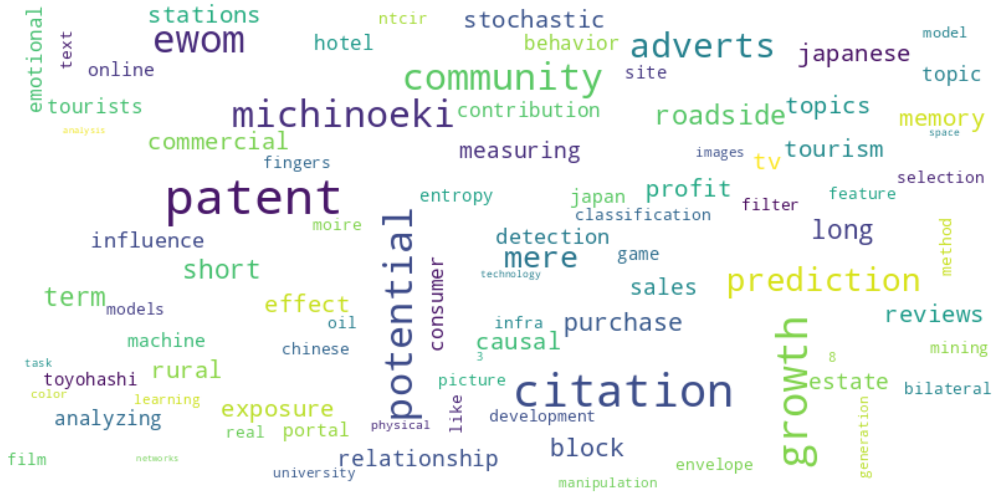

In [60]:
community_summary(116495)

,title
0,Coevolution of a Fuzzy Rule Base for Classific...
1,Adaptation of PyFlag to Efficient Analysis of ...
2,Differential Evolution in Agent-Based Computing.
3,Creative Expert System: Comparison of Proof Se...
4,Recommendation System Using Multistrategy Infe...
5,Learning in a Multi-agent Approach to a Fish B...
6,Converting a Naive Bayes Models with Multi-val...
7,B2R: An Algorithm for Converting Bayesian Netw...


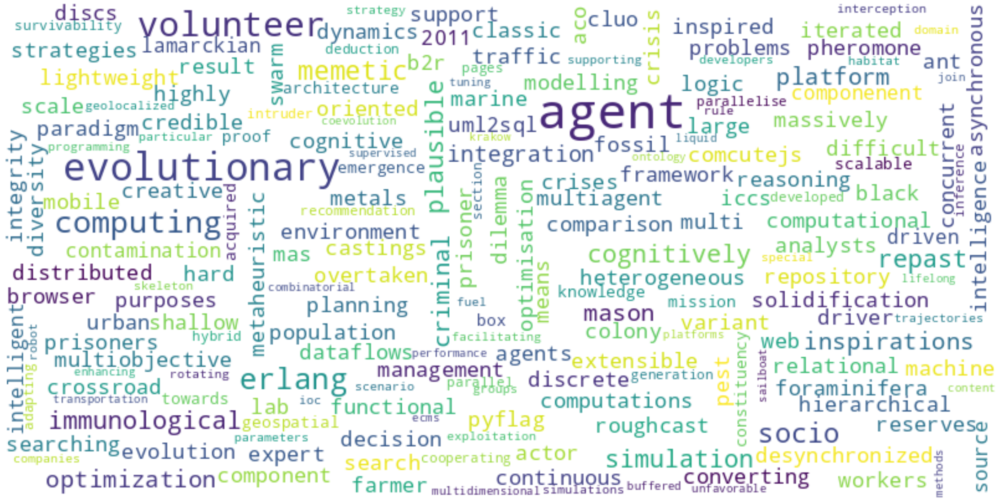

In [62]:
# Agents of agh
community_summary(6569480,tables=False)

,title
0,A Chebyshev PseudoSpectral Method to Solve the...
1,A radial basis functions method for fractional...
2,PAM: Discrete 3-D Model of Tumor Dynamics in t...
3,The Role of Floating Point Precision in Two- a...
4,Efficient Graph Comparison and Visualization U...
5,The Role of Floating Point Precision in Two- a...
6,Parallelization of GeoClaw Code for Modeling G...
7,Seismic Wave Propagation Simulation Using Acce...


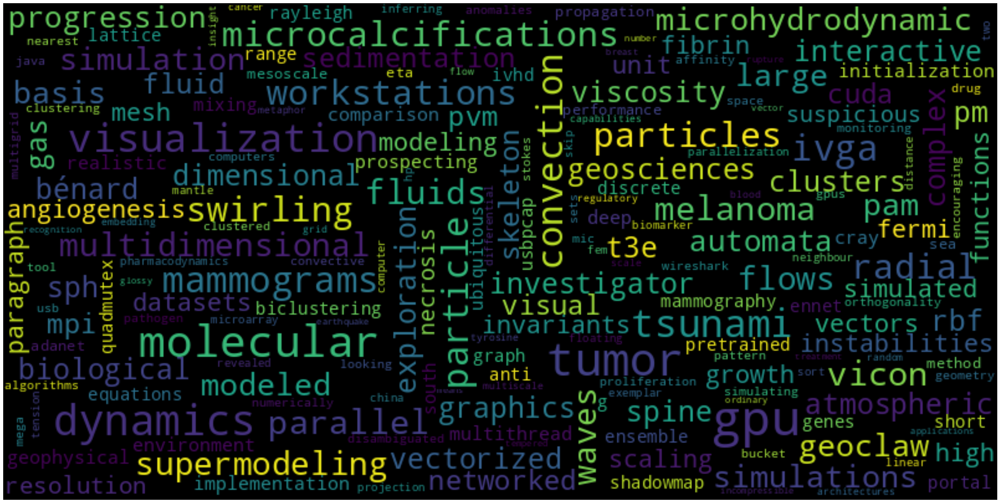

In [50]:
# Ml of agh
community_summary(461324, tables= False)

,title
0,Monitoring of Grid scientific workflows.
1,A P2P Approach to Resource Discovery in On-Lin...
2,Towards A Novel Environment for Simulation of ...
3,Teaching Quantum Computing with the QuIDE Simu...
4,Monitoring of Grid scientific workflows.
5,Grid environment for on-line application monit...
6,Flood early warning system: design implementat...
7,The UrbanFlood Common Information Space for Ea...


,keyword,count
0,grid,269
1,applications,251
2,monitoring,211
3,based,140
4,performance,135
5,distributed,115
6,virtual,92
7,support,91
8,computing,86
9,infrastructure,84


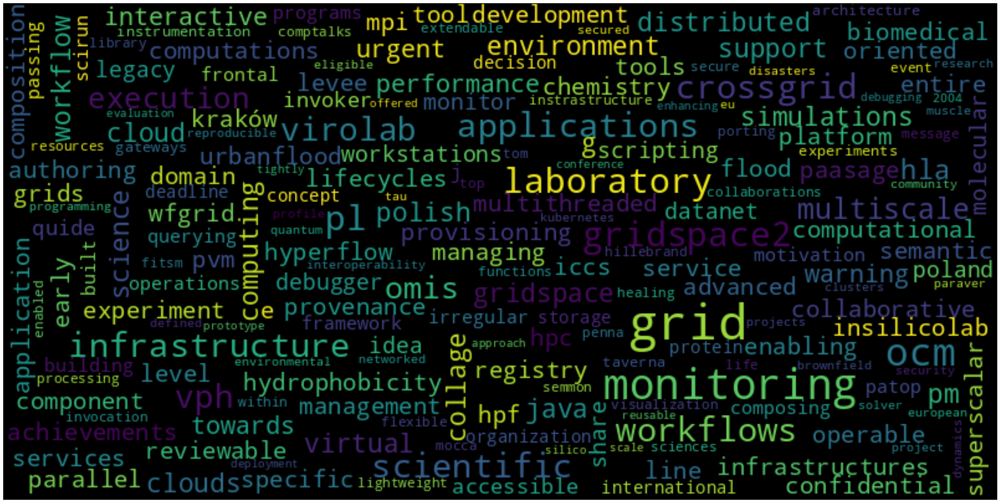

In [36]:
# Balis, bubak
community_summary(461071)

### Communities on left up of interdisciplinary graph

,title
0,Integrating in situ and multiscale passive mic...
1,Snow water equivalent retrieval in a Canadian ...
2,Retrieval of snow water equivalent over boreal...
3,The Canadian Cryospheric Information Network: ...
4,Utilizing satellite snow cover data for climat...
5,The Soil Moisture Active Passive Validation Ex...
6,Airborne GNSS-R thermal and optical data relat...
7,Assessment of version 4 of the SMAP passive so...


,keyword,count
0,soil,1641
1,moisture,1580
2,using,691
3,smap,632
4,band,596
5,data,552
6,passive,550
7,retrieval,458
8,microwave,447
9,l,437


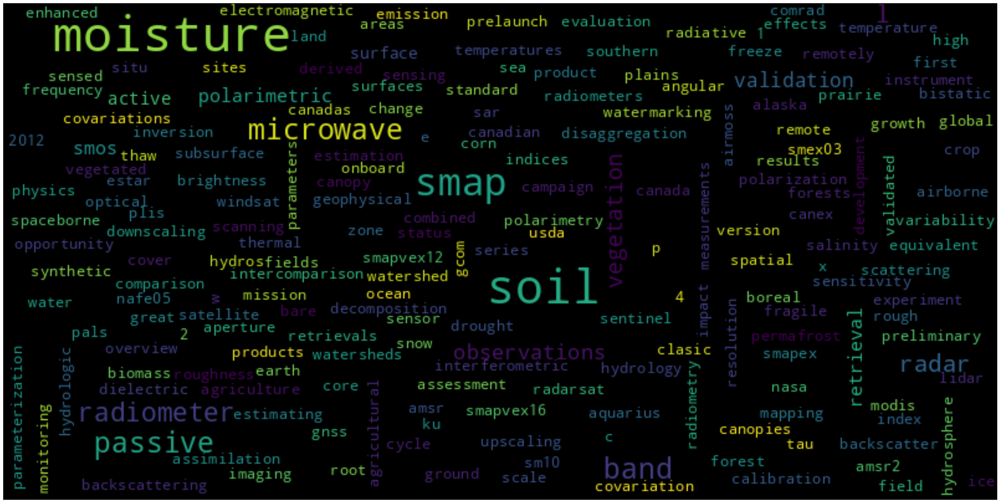

In [37]:
community_summary(806780)

,title
0,SMOS-IC Vegetation Optical Depth Index in Moni...
1,First glance on a revised SMOS soil moisture r...
2,Evaluation of the most recent reprocessed SMOS...
3,Merging two passive microwave remote sensing (...
4,Compared performances of microwave passive soi...
5,Evaluation of the Vegetation Optical Depth Ind...
6,Analyzing the impact of using the SRP (Simplif...
7,SMOS-IC: A revised SMOS product based on a new...


,keyword,count
0,soil,552
1,smos,488
2,moisture,458
3,l,232
4,band,226
5,surface,153
6,retrieval,149
7,microwave,149
8,using,146
9,data,141


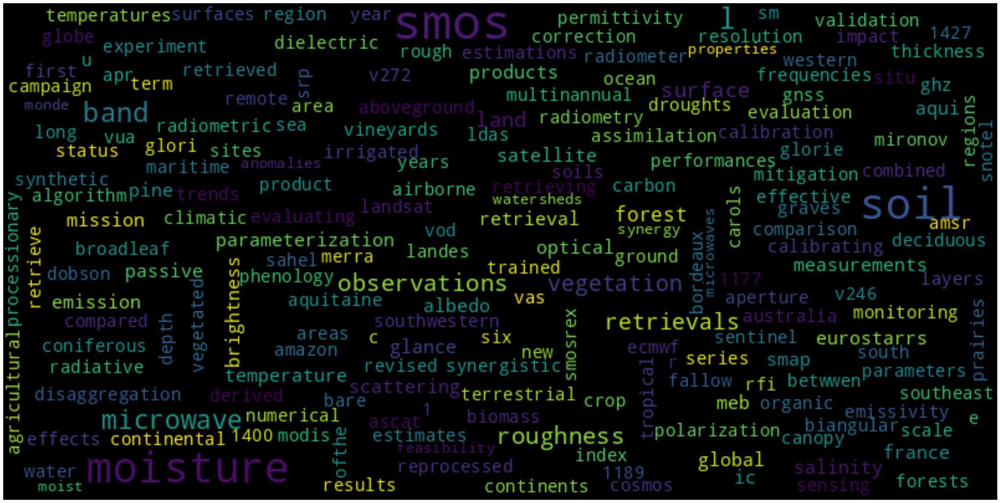

In [39]:
community_summary(806786)

### Few random communities:

,title
0,Body Parts Synthesis for Cross-Quality Pose Es...
1,Learning domain-shared group-sparse representa...
2,Torso orientation: A new clue for occlusion-aw...
3,A 3D Mask Face Anti-Spoofing Database with Rea...
4,Cross-Domain Visual Representations via Unsupe...
5,Domain-Shared Group-Sparse Dictionary Learning...
6,Efficient MRF Energy Propagation for Video Seg...
7,3D Planar Representation of Stereo Depth Image...


,keyword,count
0,tracking,2584
1,based,2213
2,object,1745
3,visual,1630
4,learning,1556
5,using,1430
6,detection,1421
7,image,1101
8,multi,902
9,recognition,837


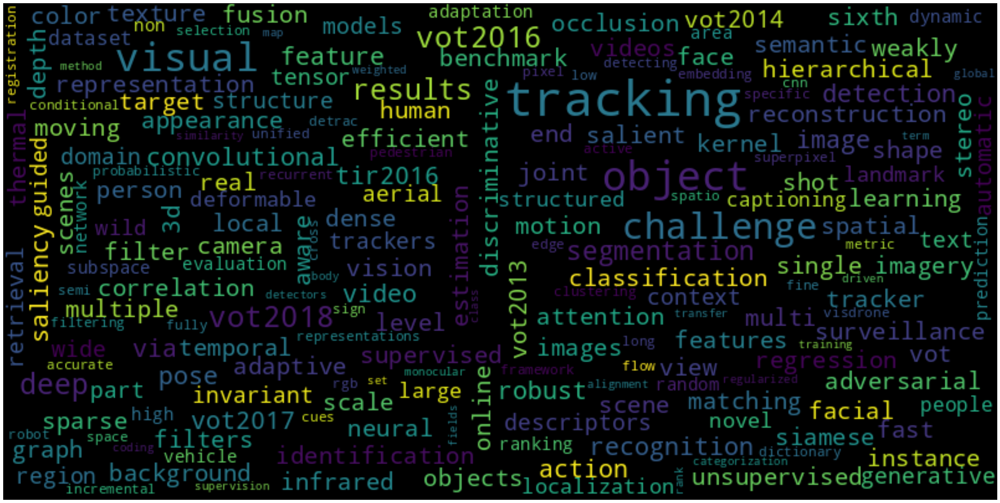

,title
0,On the stretch factor of convex polyhedra whos...
1,On the Spanning and Routing Ratio of Theta-Four.
2,Improved Spanning Ratio for Low Degree Plane S...
3,On the Stretch Factor of Convex Polyhedra whos...
4,Improved Spanning Ratio for Low Degree Plane S...
5,On the Spanning and Routing Ratio of Theta-Four.
6,Improved Spanning Ratio for Low Degree Plane S...
7,Improved Routing on the Delaunay Triangulation.


,keyword,count
0,graphs,2251
1,point,1079
2,convex,1072
3,geometric,1027
4,algorithms,946
5,planar,876
6,plane,807
7,sets,776
8,polygons,765
9,computing,756


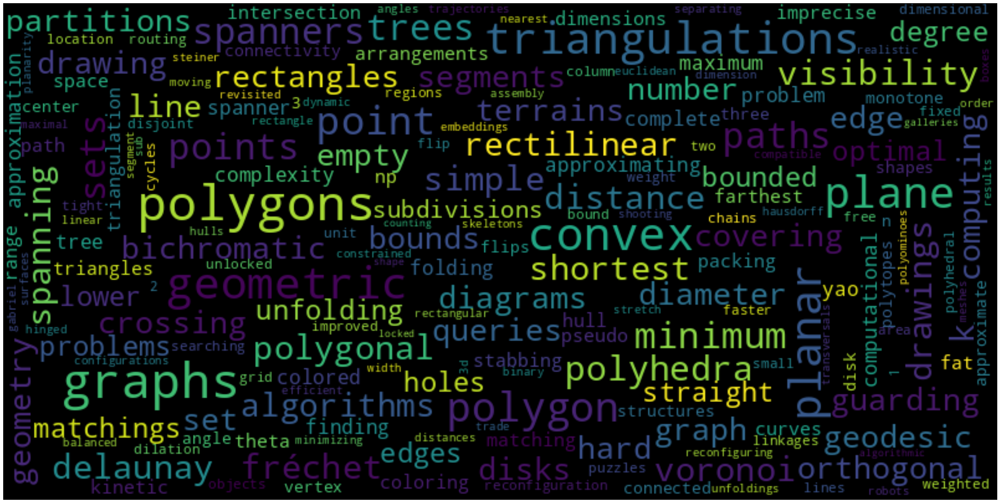

,title
0,A multiresolution descriptor for deformable 3D...
1,Retrieval and classification methods for textu...
2,A generalized divergence measure for robust im...
3,Image denoising: a nonlinear robust statistica...
4,Reconstruction of reflectance spectra using ro...
5,Video Completion Using Bandlet Transform.
6,A Finite Volume Framework for Geometric Surfac...
7,Nonrigid Image Registration Using an Entropic ...


,keyword,count
0,based,1437
1,3d,1203
2,retrieval,1015
3,using,710
4,image,692
5,shape,685
6,model,447
7,detection,365
8,multi,349
9,learning,310


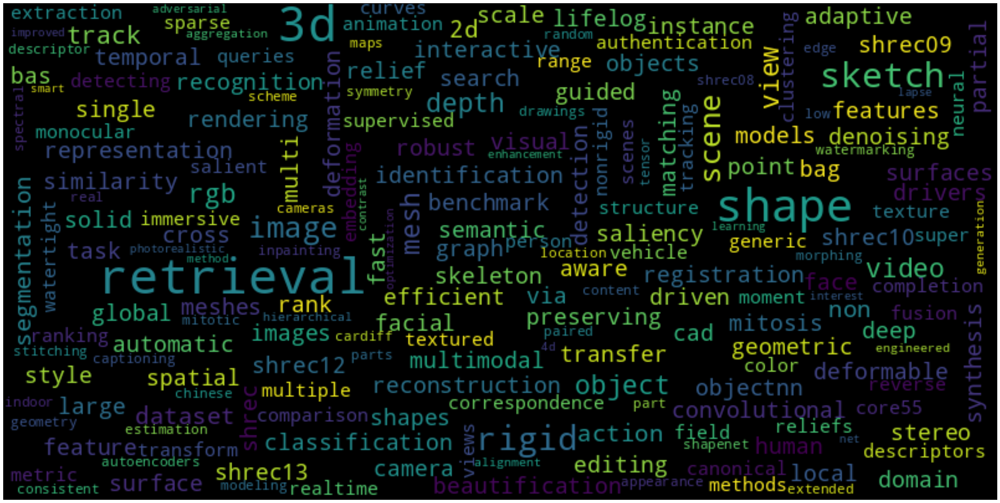

,title
0,A Patient-Controlled Journal for an Electronic...
1,Empowering Patients to Improve the Quality of ...
2,Electronic Health Record Interventions Improve...
3,Relationship between Documentation Method and ...
4,Developing strategies for predicting hyperkale...
5,Evaluation of Alerts for Potassium-Increasing ...
6,Impact of Specific Alerts in Potassium-Increas...
7,Shifting Tasks from Nurses to Physicians: CDS ...


,keyword,count
0,clinical,867
1,health,701
2,support,678
3,electronic,656
4,care,648
5,patient,636
6,decision,608
7,drug,481
8,medication,402
9,system,389


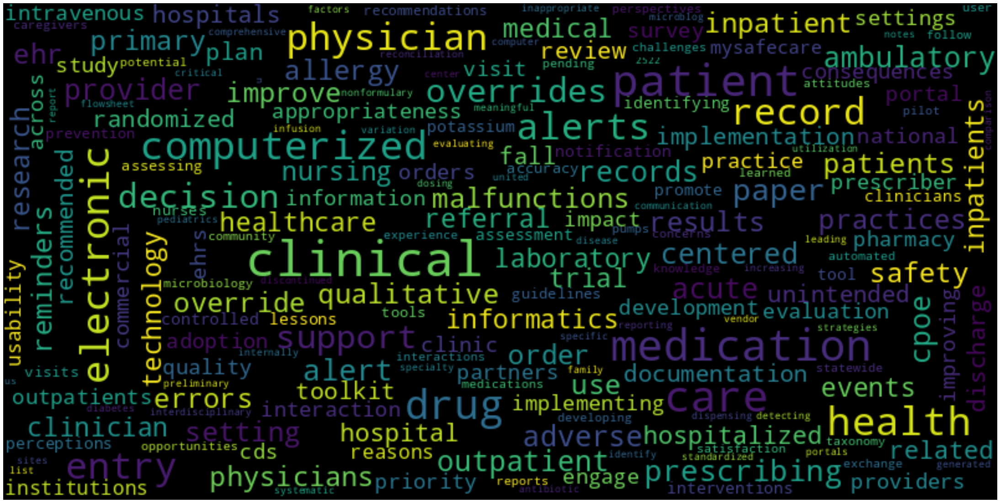

,title
0,Tag Based Generation of User Profiles.
1,An overlay network providing application-aware...
2,Comparative Study of Peer-to-Peer Architecture...
3,Caching Strategy for Scalable Lookup of Person...
4,QoE optimization through in-network quality ad...
5,A Server Placement Algorithm for Overlay Netwo...
6,Design and Configuration of PCN Based Admissio...
7,On the use of Java Server Side Technologies fo...


,keyword,count
0,networks,1463
1,based,1093
2,network,899
3,optical,572
4,design,567
5,using,530
6,wireless,509
7,service,470
8,services,450
9,management,436


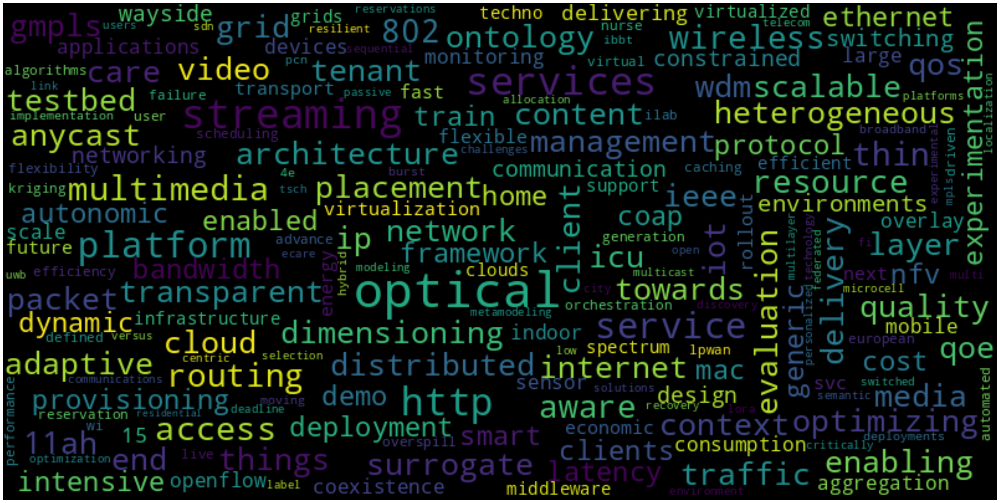

In [40]:
for label in community_sizes.where(community_sizes.cnt < 1200).dropna().head()['label']:
    community_summary(int(label))